# Projeto Final CM-219
## Professor Carlos Henrique Quartucci Forster
### Grupo:
*   Fábio Matos de Almeida
*   Gustavo Ferraresi Gottschild
*   Victoria Maria de Araujo Ferreira Felix


# Organizador Inteligente de Fotos com IA Multimodal

Ao fazer o download em massa das fotos do Google Photos, elas geralmente ficam desorganizadas, com nomes aleatórios e sem estrutura de pastas por data ou local.

Neste projeto, desenvolvemos um sistema automatizado que utiliza:

- Metadados (EXIF e JSON) para extrair **data e local** de captura das fotos;
- Geocodificação reversa para converter **coordenadas GPS em nomes de cidades**;
- Um modelo LLM multimodal (Gemini 1.5) para gerar **descrições automáticas das imagens**;
- Embeddings semânticos para **agrupar fotos com conteúdo semelhante**;
- Organização física das fotos por cidade e por tema;
- Um sistema de **busca semântica interativa**, onde o usuário pode digitar uma descrição e recuperar imagens relevantes com base no conteúdo visual;
- Geração de nuvens de palavras e visualizações que auxiliam na interpretação dos agrupamentos.

O objetivo é transformar um dump desestruturado de imagens em uma biblioteca organizada, descritiva e navegável com o apoio da inteligência artificial.


## Conectando ao Google Drive

Nesta etapa, conectamos o Google Drive ao notebook. Isso nos permite acessar a pasta onde estão armazenadas as imagens que serão analisadas e organizadas pelo sistema.


In [ ]:
# Remove qualquer montagem anterior do Google Drive (caso exista)
#!rm -rf /content/drive

# Importa o módulo para montar o Google Drive
from google.colab import drive

# Monta o Google Drive para acessar os arquivos do usuário
drive.mount('/content/drive')



Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Acessando a pasta com as imagens

Aqui definimos o caminho da pasta que contém as fotos a serem organizadas. Em seguida, listamos os arquivos dentro dessa pasta para confirmar que o caminho está correto e que os arquivos foram carregados com sucesso.


In [ ]:
import os

# Caminho da pasta no Google Drive onde estão armazenadas as fotos
photos_folder_path = '/content/drive/MyDrive/_  organizar_fotos'

try:
    # Lista os arquivos presentes na pasta especificada
    folder_content = os.listdir(photos_folder_path)
    print(f"Conteúdo da pasta '{photos_folder_path}':")
    for item in folder_content:
        print(item)
except FileNotFoundError:
    # Caso a pasta não seja encontrada
    print("Erro: pasta não encontrada. Verifique o nome.")
except Exception as e:
    # Captura outros erros genéricos
    print(f"Ocorreu um erro: {e}")


Conteúdo da pasta '/content/drive/MyDrive/_  organizar_fotos':
P_20170611_121929_009.jpg
P_20170611_121929_009.jpg.json
P_20180913_123740_vHDR_On.jpg
IMG_20130427_130738.jpg.json
IMG_20130427_130738.jpg
IMG_20140126_111247.jpg.json
IMG_20151231_215904.jpg
IMG_20151231_215904.jpg.json
IMG_20160517_105457.jpg.json
IMG_20160517_105457.jpg
IMG_2178.HEIC.json
IMG_2178.HEIC
IMG_1737.HEIC.json
IMG_1737.HEIC
DSC_1199LR.jpg.json
DSC_1199LR.jpg
IMG_20140126_111247.jpg
P_20180913_123740_vHDR_On.jpg.json


## Instalando as bibliotecas necessárias

Instalamos as bibliotecas que serão utilizadas ao longo do projeto para manipular imagens, extrair metadados, usar IA generativa e processar geolocalização.


In [ ]:
# Instala as bibliotecas necessárias para o projeto:
# - Pillow: manipulação de imagens
# - piexif: leitura e escrita de metadados EXIF
# - google-generativeai: integração com o modelo Gemini da Google
# - geopy: geocodificação (converter coordenadas em nomes de locais)
# - pillow_heif: suporte a arquivos .HEIC (fotos de iPhone)
!pip install Pillow piexif google-generativeai geopy pillow_heif --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 99.4 MB/s eta 0:00:00


##  Etapas do Pipeline

Nosso sistema segue as etapas abaixo para organizar automaticamente as fotos com o auxílio da IA:

1.  **Acessar a pasta de imagens** armazenadas no Google Drive;
2.  **Extrair metadados** das fotos (data, hora e coordenadas GPS) usando EXIF e arquivos `.json`;
3.  **Realizar geocodificação reversa** com `geopy` para converter coordenadas GPS em nomes de cidades;
4.  **Enviar as imagens para um modelo LLM multimodal** (Gemini 1.5 Flash) que interpreta o conteúdo visual;
5.  **Gerar descrições automáticas** para as imagens e propor nomes sugestivos de arquivo;
6.  **Criar embeddings semânticos** para possibilitar agrupamento e buscas inteligentes;
7.  **Organizar fisicamente os arquivos** em subpastas por cidade ou tema, com nomes mais compreensíveis.

Essas etapas são executadas de forma automatizada, transformando um acervo desorganizado em uma galeria estruturada, com apoio da inteligência artificial.


## Extraindo metadados das imagens (EXIF e JSON)

Nesta etapa, definimos funções para extrair metadados das fotos:

-  A data de captura (EXIF),
-  As coordenadas GPS (EXIF + piexif),
-  Informações complementares dos arquivos `.json` exportados pelo Google Photos.

Esses dados são essenciais para identificar quando e onde a imagem foi tirada.


In [ ]:
from PIL import Image
from PIL.ExifTags import TAGS, GPSTAGS
import piexif
import json
import datetime

# Função para extrair os metadados EXIF de uma imagem
def get_exif_data(image_path):
    exif_data = {}
    try:
        with Image.open(image_path) as img:
            if hasattr(img, '_getexif'):
                info = img._getexif()
                if info:
                    # Converte as tags EXIF para nomes legíveis
                    for tag, value in info.items():
                        decoded = TAGS.get(tag, tag)
                        exif_data[decoded] = value

            # Tenta extrair dados GPS usando piexif
            try:
                exif_dict = piexif.load(image_path)
                if "GPS" in exif_dict:
                    gps_info = {}
                    for key, val in exif_dict["GPS"].items():
                        decoded_key = GPSTAGS.get(key, key)
                        gps_info[decoded_key] = val
                    exif_data['GPSInfo'] = gps_info
            except:
                pass  # ignora falhas silenciosamente
    except:
        pass  # ignora imagens que não abrem corretamente
    return exif_data

# Converte coordenadas em formato DMS (grau, minuto, segundo) para graus decimais
def convert_dms_to_degrees(value):
    d0, d1 = value[0]
    m0, m1 = value[1]
    s0, s1 = value[2]
    degrees = float(d0) / float(d1)
    minutes = float(m0) / float(m1)
    seconds = float(s0) / float(s1)
    return degrees + (minutes / 60.0) + (seconds / 3600.0)

# Extrai as coordenadas GPS (latitude e longitude) dos metadados EXIF
def get_gps_coordinates(exif_data):
    gps_info = exif_data.get('GPSInfo')
    if gps_info:
        gps_latitude = gps_info.get('GPSLatitude')
        gps_latitude_ref = gps_info.get('GPSLatitudeRef')
        gps_longitude = gps_info.get('GPSLongitude')
        gps_longitude_ref = gps_info.get('GPSLongitudeRef')
        if gps_latitude and gps_latitude_ref and gps_longitude and gps_longitude_ref:
            lat = convert_dms_to_degrees(gps_latitude)
            lon = convert_dms_to_degrees(gps_longitude)
            # Ajusta sinal com base nos hemisférios
            if gps_latitude_ref != "N": lat = -lat
            if gps_longitude_ref != "E": lon = -lon
            return lat, lon
    return None, None

# Extrai a data de captura da imagem a partir do EXIF
def get_date_taken(exif_data):
    date_str = (
        exif_data.get('DateTimeOriginal')
        or exif_data.get('DateTimeDigitized')
        or exif_data.get('DateTime')
    )
    if date_str:
        try:
            return datetime.datetime.strptime(date_str, '%Y:%m:%d %H:%M:%S')
        except ValueError:
            return None
    return None

# Lê os arquivos JSON exportados pelo Google Photos (metadados complementares)
def load_google_photos_json(json_path):
    try:
        with open(json_path, 'r', encoding='utf-8') as f:
            return json.load(f)
    except:
        return None  # se o arquivo estiver corrompido ou mal formatado


##  Geocodificação Reversa: Coordenadas → Nome do Local

Com as coordenadas GPS extraídas do EXIF, usamos a biblioteca `geopy` para realizar geocodificação reversa, ou seja, converter latitude e longitude em nomes de locais como cidade, estado e país.

A função abaixo utiliza o serviço Nominatim (OpenStreetMap) e respeita os limites de requisições (1 por segundo). Também trata exceções como timeouts ou falhas no serviço.


In [ ]:
from geopy.geocoders import Nominatim
from geopy.exc import GeocoderTimedOut, GeocoderServiceError
import time

# Inicializa o geocodificador com nome do aplicativo (obrigatório pelo Nominatim)
geolocator = Nominatim(user_agent="GooglePhotosOrganizerApp")

#  Função que transforma coordenadas (latitude, longitude) em nome do local (cidade, estado, país)
def get_location_name(latitude, longitude):
    if latitude is None or longitude is None:
        return None  # Se as coordenadas estiverem ausentes, retorna None

    try:
        # Aguarda 1 segundo entre as requisições para não sobrecarregar o serviço (rate limit)
        time.sleep(1)
        location = geolocator.reverse((latitude, longitude), exactly_one=True, language='en')

        if location:
            address = location.raw.get('address', {})

            # Tenta extrair cidade, estado e país da resposta
            city = address.get('city') or address.get('town') or address.get('village')
            state = address.get('state')
            country = address.get('country')

            parts = []
            if city: parts.append(city)
            if state and state != city: parts.append(state)
            if country: parts.append(country)

            # Retorna uma string do tipo: "Campinas, São Paulo, Brazil"
            return ", ".join(parts) if parts else location.address
        return None

    # Tratamento de exceções
    except GeocoderTimedOut:
        print(f"Timeout na geocodificação de {latitude}, {longitude}. Retentando...")
        time.sleep(5)
        return get_location_name(latitude, longitude)
    except GeocoderServiceError as e:
        print(f"Erro no serviço de geocodificação: {e}")
        return None
    except Exception as e:
        print(f"Erro inesperado durante geocodificação: {e}")
        return None


##  Processando as imagens e extraindo informações

Nesta etapa, percorremos todas as imagens da pasta e coletamos suas informações:

- Tentamos carregar os metadados do Google Photos (.json),
- Caso não estejam disponíveis, tentamos extrair do EXIF da imagem,
- Também usamos as coordenadas (se disponíveis) para obter o nome da cidade via geocodificação,
- Todas as informações são organizadas em um dicionário e salvas na lista `processed_photos_data`.

Esse processamento é a base para as próximas etapas do pipeline, como renomear, classificar ou mover os arquivos.


In [ ]:
processed_photos_data = []  # Lista que armazenará os dados processados

print(f"Iniciando o processamento da pasta: {photos_folder_path}\n")

# Percorre os arquivos da pasta
for filename in os.listdir(photos_folder_path):
    file_path = os.path.join(photos_folder_path, filename)

    if os.path.isdir(file_path):
        continue  # Ignora subpastas

    if filename.lower().endswith(('.jpg', '.jpeg', '.png', '.heic')):
        print(f"--- Processando imagem: {filename} ---")

        # Inicializa o dicionário com dados da imagem
        photo_info = {
            'filename': filename,
            'file_path': file_path,
            'date': None,
            'latitude': None,
            'longitude': None,
            'location_name': None,
            'date_source': 'none',
            'geo_source': 'none'
        }

        # Tenta carregar o arquivo .json correspondente
        json_path = file_path + ".json"
        json_data = load_google_photos_json(json_path)

        if json_data:
            # 🗓️ Extrai data do JSON (formato do Google Photos)
            date_str = json_data.get('photoTakenTime', {}).get('formatted')
            if date_str:
                try:
                    # Ajusta mês e formato para o datetime
                    date_str = date_str.replace(' de ', ' ').replace(' UTC', '').replace('.', '').strip()
                    month_map = {
                        'jan': 'Jan', 'fev': 'Feb', 'mar': 'Mar', 'abr': 'Apr',
                        'mai': 'May', 'jun': 'Jun', 'jul': 'Jul', 'ago': 'Aug',
                        'set': 'Sep', 'out': 'Oct', 'nov': 'Nov', 'dez': 'Dec'
                    }
                    for pt, en in month_map.items():
                        date_str = date_str.replace(pt, en)

                    for fmt in ['%d %b %Y, %H:%M:%S', '%d %b %Y %H:%M:%S', '%Y-%m-%d %H:%M:%S']:
                        try:
                            parsed_date = datetime.datetime.strptime(date_str, fmt)
                            photo_info['date'] = parsed_date.strftime('%Y-%m-%d %H:%M:%S')
                            photo_info['date_source'] = 'json'
                            break
                        except:
                            continue
                except:
                    pass

            #  Extrai coordenadas GPS do JSON
            geo = json_data.get('geoData', {})
            lat = geo.get('latitude')
            lon = geo.get('longitude')
            if lat is not None and lon is not None:
                photo_info['latitude'] = lat
                photo_info['longitude'] = lon
                photo_info['geo_source'] = 'json'

        # Se o JSON não ajudou, tenta o EXIF
        exif_data = get_exif_data(file_path)
        if exif_data:
            if not photo_info['date']:
                exif_date = get_date_taken(exif_data)
                if exif_date:
                    photo_info['date'] = exif_date.strftime('%Y-%m-%d %H:%M:%S')
                    photo_info['date_source'] = 'exif'

            if not photo_info['latitude']:
                lat, lon = get_gps_coordinates(exif_data)
                if lat is not None and lon is not None:
                    photo_info['latitude'] = lat
                    photo_info['longitude'] = lon
                    photo_info['geo_source'] = 'exif'

        # Geocodificação reversa: coordenadas → nome do local
        if photo_info['latitude'] and photo_info['longitude']:
            location = get_location_name(photo_info['latitude'], photo_info['longitude'])
            photo_info['location_name'] = location

        # Adiciona os dados processados à lista final
        processed_photos_data.append(photo_info)

        # Exibe os dados resumidos
        print(f"  Data: {photo_info['date']}")
        print(f"  Local: {photo_info['location_name']}")
        print("-" * 30)

# Exibe o total de imagens analisadas
print(f"\nTotal de imagens processadas: {len(processed_photos_data)}")


Iniciando o processamento da pasta: /content/drive/MyDrive/_  organizar_fotos

--- Processando imagem: P_20170611_121929_009.jpg ---
  Data: 2017-06-11 03:19:29
  Local: None
------------------------------
--- Processando imagem: P_20180913_123740_vHDR_On.jpg ---
  Data: 2018-09-13 07:37:21
  Local: None
------------------------------
--- Processando imagem: IMG_20130427_130738.jpg ---
  Data: 2013-04-27 16:07:38
  Local: São José dos Campos, São Paulo, Brazil
------------------------------
--- Processando imagem: IMG_20151231_215904.jpg ---
  Data: 2015-12-31 23:59:05
  Local: São José dos Campos, São Paulo, Brazil
------------------------------
--- Processando imagem: IMG_20160517_105457.jpg ---
  Data: 2016-05-17 13:55:00
  Local: Mata de São João, Bahia, Brazil
------------------------------
--- Processando imagem: IMG_2178.HEIC ---
  Data: 2019-10-04 03:38:13
  Local: Nagoya, Japan
------------------------------
--- Processando imagem: IMG_1737.HEIC ---
  Data: 2019-09-22 03:27:37

##  Configurando o modelo multimodal Gemini

Utilizamos o modelo Gemini 1.5 Flash da Google para gerar descrições automáticas das fotos.

Para isso, configuramos a API do Google Generative AI usando uma chave de acesso privada, que pode ser adicionada via:
**`Colab > Tools > Secrets`** → `GEMINI_API_KEY`

Essa etapa permite que o modelo interprete o conteúdo visual das imagens e gere um texto descritivo que usaremos como nome do arquivo.


In [ ]:
import google.generativeai as genai
from google.colab import userdata

try:
    # Obtém a chave secreta armazenada nos "Secrets" do Colab
    API_KEY = userdata.get('GEMINI_API_KEY')
    if not API_KEY:
        raise ValueError("GEMINI_API_KEY não encontrada. Adicione-a em 'Colab > Tools > Secrets'.")

    # Configura a API com a chave
    genai.configure(api_key=API_KEY)

    # Inicializa o modelo Gemini 1.5 Flash
    model = genai.GenerativeModel('gemini-1.5-flash')
    print("Gemini configurado com sucesso!")

except Exception as e:
    print(f"Erro ao configurar o Gemini: {e}")



Gemini configurado com sucesso!


##  Gerando descrições automáticas com Gemini

Agora que temos o modelo configurado, utilizamos o Gemini 1.5 Flash para gerar uma **descrição curta e sugestiva** para cada imagem.

- O modelo analisa visualmente a imagem e responde a um **prompt cuidadosamente elaborado**;
- O objetivo é obter uma descrição que possa servir como **nome de arquivo amigável**;
- Evitamos menções a datas e locais, já que essas informações já foram extraídas antes.

Esse passo transforma o conteúdo visual em texto semântico, permitindo uma organização mais inteligente das fotos.


In [ ]:
from PIL import Image
from PIL.ExifTags import TAGS, GPSTAGS
import piexif
import json
import datetime
import io # Importar para trabalhar com bytes em memória
from pillow_heif import register_heif_opener # Importar o registrador do HEIF

# É uma boa prática registrar o opener no início do script se houver problemas
# de identificação automática. Embora o pip install já faça isso,
# chamar explicitamente garante que esteja ativo.
register_heif_opener()

# Função para gerar uma descrição automática da imagem com Gemini
def generate_image_description(photo_info, model):
    try:
        img = None
        file_path = photo_info['file_path']

        if file_path.lower().endswith('.heic'):
            # Tentar abrir HEIC com Pillow (agora com pillow_heif registrado)
            # e converter para RGB para garantir compatibilidade antes de enviar ao Gemini
            img = Image.open(file_path).convert("RGB")
        else:
            # Abrir outros formatos normalmente
            img = Image.open(file_path).convert("RGB")

        if img is None:
            raise ValueError(f"Não foi possível abrir a imagem {file_path}")

        # Prompt passado ao modelo Gemini
        prompt = (
            "Describe this image in a concise, suggestive way, suitable for a filename. "
            "Focus on main objects, actions or themes. Max 15 words. Do not mention date or location."
            "Give the description in Portuguese."
        )

        # Gera o conteúdo com a imagem e o prompt
        # O Gemini aceita objetos PIL.Image diretamente.
        response = model.generate_content([prompt, img])

        # Extrai o texto da resposta
        description = response.candidates[0].content.parts[0].text
        return description.strip()

    except Exception as e:
        print(f"Erro ao gerar descrição para {photo_info['filename']}: {e}")
        return "Descrição_indisponível"

#  Aplica a geração para todas as imagens já processadas
print("\nIniciando geração de descrições com Gemini...\n")
for photo in processed_photos_data:
    print(f"Imagem: {photo['filename']}")
    desc = generate_image_description(photo, model)
    photo['description_gemini'] = desc
    print(f"→ Descrição: {desc}")
    print("-" * 40)


Iniciando geração de descrições com Gemini...

Imagem: P_20170611_121929_009.jpg
→ Descrição: Crianças carrinho passeio, irmãos, brincadeira.
----------------------------------------
Imagem: P_20180913_123740_vHDR_On.jpg
→ Descrição: Menina fofa, orelhas de coelho, sorrindo, restaurante.
----------------------------------------
Imagem: IMG_20130427_130738.jpg
→ Descrição: Bebê na caminha, móbile, primeiros passos.
----------------------------------------
Imagem: IMG_20151231_215904.jpg
→ Descrição: Pai com bebês, abraço familiar.
----------------------------------------
Imagem: IMG_20160517_105457.jpg
→ Descrição: Mãe e bebê relaxando na praia.
----------------------------------------
Imagem: IMG_2178.HEIC
→ Descrição: Menina unicórnio, parque, pose divertida.
----------------------------------------
Imagem: IMG_1737.HEIC
→ Descrição: Menino, ave, praia, varanda.
----------------------------------------
Imagem: DSC_1199LR.jpg
→ Descrição: Mãe e filhos, kimonos, outono, afeto.
--------

##  Resumo Final

Exibimos aqui todas as informações extraídas e geradas para cada foto processada:

- Nome do arquivo original;
- Data e fonte de origem (EXIF ou JSON);
- Localização interpretada a partir das coordenadas GPS;
- Descrição automática gerada pelo modelo Gemini.

Esse resumo pode ser exportado, salvo ou utilizado em etapas seguintes como renomear ou organizar os arquivos.


In [ ]:
print("\n--- RESUMO FINAL ---")

# Percorre todos os dados processados e imprime as informações principais
for photo in processed_photos_data:
    print(f"Arquivo: {photo['filename']}")
    print(f"Data: {photo['date']} (Fonte: {photo['date_source']})")
    print(f"Localização: {photo['location_name']} (Fonte: {photo['geo_source']})")
    print(f"Descrição Gemini: {photo.get('description_gemini', 'Não disponível')}")
    print("-" * 50)



--- RESUMO FINAL ---
Arquivo: P_20170611_121929_009.jpg
Data: 2017-06-11 03:19:29 (Fonte: json)
Localização: None (Fonte: json)
Descrição Gemini: Crianças carrinho passeio, irmãos, brincadeira.
--------------------------------------------------
Arquivo: P_20180913_123740_vHDR_On.jpg
Data: 2018-09-13 07:37:21 (Fonte: json)
Localização: None (Fonte: json)
Descrição Gemini: Menina fofa, orelhas de coelho, sorrindo, restaurante.
--------------------------------------------------
Arquivo: IMG_20130427_130738.jpg
Data: 2013-04-27 16:07:38 (Fonte: json)
Localização: São José dos Campos, São Paulo, Brazil (Fonte: json)
Descrição Gemini: Bebê na caminha, móbile, primeiros passos.
--------------------------------------------------
Arquivo: IMG_20151231_215904.jpg
Data: 2015-12-31 23:59:05 (Fonte: json)
Localização: São José dos Campos, São Paulo, Brazil (Fonte: json)
Descrição Gemini: Pai com bebês, abraço familiar.
--------------------------------------------------
Arquivo: IMG_20160517_105457

##  Organização automática por cidade

Nesta etapa, o sistema reorganiza os arquivos físicos movendo as fotos para **pastas nomeadas de acordo com o local** (cidade, estado ou país) onde foram tiradas.

- Se a localização estiver ausente, as fotos vão para a pasta `Local_desconhecido`;
- Nomes de pastas são limpos (sem vírgulas/acentos) e limitados a 50 caracteres;
- Isso permite uma navegação estruturada, como:

/GooglePhotos/

├── Paris_France/

├── São_Paulo_Brazil/

└── Local_desconhecido/

In [ ]:
import os
import shutil

print("\nOrganizando imagens por cidade...\n")

# Percorre todas as fotos processadas
for photo in processed_photos_data:
    # Usa o nome do local extraído ou uma string padrão
    location = photo['location_name'] or "Local_desconhecido"

    # Cria um nome de pasta seguro (sem vírgulas e espaços)
    folder_name = location.replace(",", "").replace(" ", "_")[:50]

    # Cria o caminho completo para a pasta de destino
    target_folder = os.path.join(photos_folder_path, folder_name)

    # Garante que a pasta existe
    os.makedirs(target_folder, exist_ok=True)

    # --- Início das modificações para incluir o JSON ---

    # Caminho original da imagem
    src_image_path = photo['file_path']
    # Caminho de destino da imagem
    dst_image_path = os.path.join(target_folder, photo['filename'])

    # Tenta mover o arquivo de imagem
    if os.path.exists(src_image_path):
        try:
            shutil.move(src_image_path, dst_image_path)
            print(f" {photo['filename']} → {folder_name}/")
            photo['file_path'] = dst_image_path  # Atualiza o caminho da imagem

            # Verifica e move o arquivo JSON correspondente, se existir
            src_json_path = src_image_path + ".json"
            if os.path.exists(src_json_path):
                json_filename = photo['filename'] + ".json"
                dst_json_path = os.path.join(target_folder, json_filename)
                try:
                    shutil.move(src_json_path, dst_json_path)
                    print(f" {json_filename} → {folder_name}/ (JSON movido)")
                except Exception as json_e:
                    print(f"Erro ao mover JSON {json_filename}: {json_e}")

        except Exception as e:
            print(f"Erro ao mover imagem {photo['filename']}: {e}")
    else:
        print(f"Aviso: Imagem {photo['filename']} não encontrada em {src_image_path}. Pulando.")


Organizando imagens por cidade...

 P_20170611_121929_009.jpg → Local_desconhecido/
 P_20170611_121929_009.jpg.json → Local_desconhecido/ (JSON movido)
 P_20180913_123740_vHDR_On.jpg → Local_desconhecido/
 P_20180913_123740_vHDR_On.jpg.json → Local_desconhecido/ (JSON movido)
 IMG_20130427_130738.jpg → São_José_dos_Campos_São_Paulo_Brazil/
 IMG_20130427_130738.jpg.json → São_José_dos_Campos_São_Paulo_Brazil/ (JSON movido)
 IMG_20151231_215904.jpg → São_José_dos_Campos_São_Paulo_Brazil/
 IMG_20151231_215904.jpg.json → São_José_dos_Campos_São_Paulo_Brazil/ (JSON movido)
 IMG_20160517_105457.jpg → Mata_de_São_João_Bahia_Brazil/
 IMG_20160517_105457.jpg.json → Mata_de_São_João_Bahia_Brazil/ (JSON movido)
 IMG_2178.HEIC → Nagoya_Japan/
 IMG_2178.HEIC.json → Nagoya_Japan/ (JSON movido)
 IMG_1737.HEIC → Malé_Atoll_Maldives/
 IMG_1737.HEIC.json → Malé_Atoll_Maldives/ (JSON movido)
 DSC_1199LR.jpg → Local_desconhecido/
 DSC_1199LR.jpg.json → Local_desconhecido/ (JSON movido)
 IMG_20140126_1112

##  Renomeando os arquivos com nomes descritivos

Nesta etapa, renomeamos os arquivos de imagem com base nas seguintes informações:

-  **Data** da captura;
-  **Cidade** onde a foto foi tirada;
-  **Descrição** gerada pelo modelo Gemini.

O novo nome de arquivo tem o seguinte formato:

YYYY-MM-DD_Cidade_descrição-da-imagem.extensão


Isso facilita buscas manuais, evita nomes genéricos (tipo IMG_1234.jpg) e ajuda na organização a longo prazo.

In [ ]:
import os
import re
import shutil # Importamos shutil para mover arquivos, caso o JSON não esteja na mesma pasta da imagem depois da organização por cidade/cluster

# Função para gerar uma string limpa (slug) a partir do texto
def slugify(text):
    # Remove caracteres especiais, coloca tudo em minúsculo e substitui espaços por "_"
    text = re.sub(r'[^\w\s-]', '', text).strip().lower()
    return re.sub(r'[-\s]+', '_', text)

print("\nRenomeando arquivos com base na descrição do Gemini...\n")

# Percorre todas as fotos processadas
for photo in processed_photos_data:
    desc = photo.get('description_gemini', '')

    # Pula imagens sem descrição gerada
    if not desc or 'Descrição_indisponível' in desc:
        continue

    # Gera o slug da descrição (curto e limpo)
    slug = slugify(desc)[:40]  # Limita a 40 caracteres

    # Partes do novo nome
    date_part = photo['date'].split(" ")[0] if photo['date'] else "data_indefinida"
    # Certifica-se de que 'location_name' existe e não é None antes de tentar split
    location_part = photo['location_name'].split(",")[0].replace(" ", "_") if photo['location_name'] else "local_indefinido"

    # Monta o novo nome do arquivo (sem extensão ainda)
    new_base_name = f"{date_part}_{location_part}_{slug}"

    # Caminho original completo da imagem
    old_image_path = photo['file_path']
    # Extrai a extensão original da imagem
    image_ext = os.path.splitext(old_image_path)[1]
    # Novo nome completo da imagem
    new_image_filename = new_base_name + image_ext
    # Novo caminho completo da imagem (mantém na mesma pasta)
    new_image_path = os.path.join(os.path.dirname(old_image_path), new_image_filename)

    try:
        # Renomeia o arquivo de imagem
        os.rename(old_image_path, new_image_path)
        print(f" {photo['filename']} → {new_image_filename}")

        # Atualiza no dicionário (muito importante para etapas futuras)
        photo['filename'] = new_image_filename
        photo['file_path'] = new_image_path

        # --- Início da lógica para renomear o JSON correspondente ---
        # Constrói o caminho potencial do arquivo JSON original
        # O JSON original tem o nome da imagem original + .json
        old_json_path = old_image_path + ".json"

        # Constrói o novo caminho do arquivo JSON
        new_json_filename = new_base_name + image_ext + ".json"
        new_json_path = os.path.join(os.path.dirname(old_image_path), new_json_filename)

        if os.path.exists(old_json_path):
            try:
                os.rename(old_json_path, new_json_path)
                print(f"  JSON correspondente renomeado para: {new_json_filename}")
            except Exception as json_e:
                print(f"  Erro ao renomear JSON {os.path.basename(old_json_path)}: {json_e}")
        # --- Fim da lógica para renomear o JSON correspondente ---

    except Exception as e:
        print(f"Erro ao renomear {photo['filename']}: {e}")


Renomeando arquivos com base na descrição do Gemini...

 P_20170611_121929_009.jpg → 2017-06-11_local_indefinido_crianças_carrinho_passeio_irmãos_brincad.jpg
  JSON correspondente renomeado para: 2017-06-11_local_indefinido_crianças_carrinho_passeio_irmãos_brincad.jpg.json
 P_20180913_123740_vHDR_On.jpg → 2018-09-13_local_indefinido_menina_fofa_orelhas_de_coelho_sorrindo_r.jpg
  JSON correspondente renomeado para: 2018-09-13_local_indefinido_menina_fofa_orelhas_de_coelho_sorrindo_r.jpg.json
 IMG_20130427_130738.jpg → 2013-04-27_São_José_dos_Campos_bebê_na_caminha_móbile_primeiros_passos.jpg
  JSON correspondente renomeado para: 2013-04-27_São_José_dos_Campos_bebê_na_caminha_móbile_primeiros_passos.jpg.json
 IMG_20151231_215904.jpg → 2015-12-31_São_José_dos_Campos_pai_com_bebês_abraço_familiar.jpg
  JSON correspondente renomeado para: 2015-12-31_São_José_dos_Campos_pai_com_bebês_abraço_familiar.jpg.json
 IMG_20160517_105457.jpg → 2016-05-17_Mata_de_São_João_mãe_e_bebê_relaxando_na_prai

##  Instalando bibliotecas para visualização e agrupamento

Instalamos abaixo os pacotes adicionais necessários para as etapas finais do projeto:

- `scikit-learn`: para análise de similaridade textual e agrupamento de descrições;
- `wordcloud`: para visualização das palavras mais frequentes;
- `matplotlib`: para exibição de gráficos e imagens.

Essas ferramentas serão usadas para enriquecer a análise semântica do conjunto de fotos.


In [ ]:
!pip install scikit-learn wordcloud matplotlib --quiet

##  Gerando embeddings semânticos das descrições

Nesta etapa, cada descrição gerada pelo Gemini é convertida em um **vetor de embedding**, que representa o conteúdo semântico da frase de forma numérica.

Utilizamos a API do Gemini com o modelo `embedding-001`, e isso nos permite:

- Calcular **similaridades** entre fotos;
- Aplicar **clustering**;
- Criar visualizações inteligentes com base no conteúdo das imagens.

Apenas fotos com descrições válidas são consideradas nesta etapa.


In [ ]:
embeddings = []
valid_photos = []

# Gera embedding apenas para descrições válidas
for photo in processed_photos_data:
    desc = photo.get('description_gemini', '')
    if not desc or "Descrição_indisponível" in desc:
        continue  # ignora fotos sem descrição válida

    try:
        # Chamada à API para gerar o embedding semântico da descrição
        response = genai.embed_content(
            model="models/embedding-001",
            content=desc,
            task_type="retrieval_document"
        )
        emb = response['embedding']
        embeddings.append(emb)
        valid_photos.append(photo)
    except Exception as e:
        print(f"Erro ao gerar embedding: {e}")


##  Agrupamento semântico com K-Means

Usamos o algoritmo **K-Means** para agrupar as imagens em categorias baseadas nas descrições geradas:

- As descrições são representadas como vetores (embeddings);
- O K-Means encontra padrões semânticos e agrupa as imagens similares;
- Cada imagem recebe um **rótulo de cluster**, armazenado no dicionário `photo['cluster']`.

Esses clusters podem revelar temas ocultos como “fotos de comida”, “fotos na praia” ou “fotos em eventos sociais”.

O número de clusters pode ser ajustado conforme desejado (ex: `n_clusters = 3`).

In [ ]:
from sklearn.cluster import KMeans
import numpy as np

n_clusters = 3  # número de grupos semânticos (ajustável)

# Converte a lista de embeddings em array NumPy
X = np.array(embeddings)

# Aplica K-Means
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
labels = kmeans.fit_predict(X)

# Associa cada imagem ao seu cluster
for photo, label in zip(valid_photos, labels):
    photo['cluster'] = label


##  Visualização dos clusters com WordClouds

Para interpretar melhor os grupos formados pelo K-Means, criamos **nuvens de palavras** (WordClouds) com as descrições geradas para cada cluster.

Cada nuvem revela os temas e palavras mais frequentes dentro de um grupo de imagens. Isso permite:

- Compreender o conteúdo dominante por cluster;
- Validar se o agrupamento semântico fez sentido;
- Apresentar visualmente os resultados da IA.

As palavras maiores representam termos mais recorrentes entre as imagens daquele grupo.



Gerando nuvens de palavras por cluster...



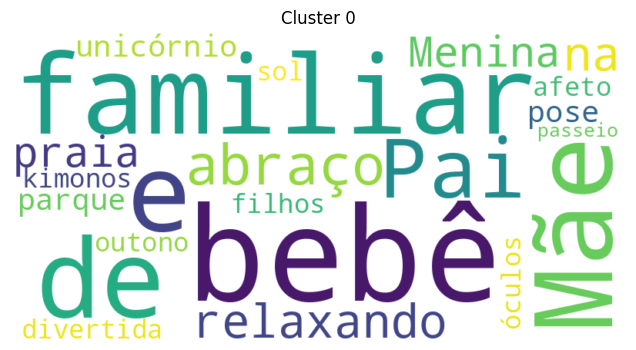

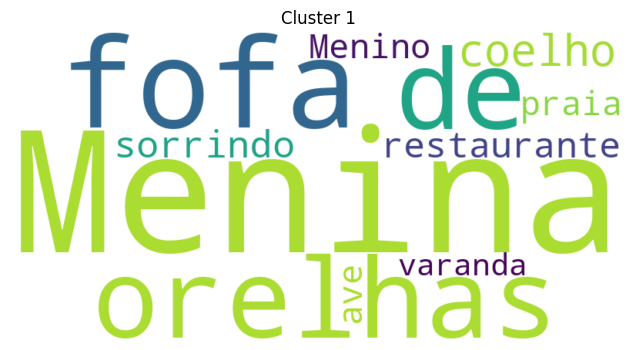

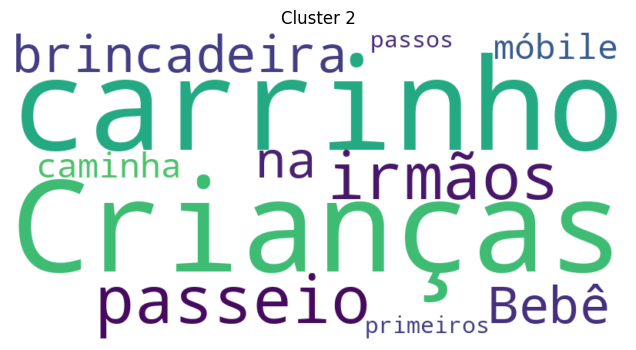

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

print("\nGerando nuvens de palavras por cluster...\n")

for i in range(n_clusters):
    # Junta todas as descrições do cluster i
    text = " ".join(
        photo['description_gemini'] for photo in valid_photos if photo['cluster'] == i
    )
    if not text:
        continue

    # Gera a nuvem de palavras
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

    # Plota a nuvem
    plt.figure(figsize=(10, 4))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f"Cluster {i}")
    plt.show()



##  Organização final das imagens por grupo semântico

Após o agrupamento, organizamos as imagens em subpastas chamadas `Cluster_0`, `Cluster_1`, etc.

Cada pasta representa um **grupo de imagens semanticamente similares**, com base nas descrições geradas pelo modelo Gemini e no agrupamento via K-Means.

Essa estrutura permite uma visualização clara dos resultados e pode ser útil para sistemas de busca ou categorização automática de fotos.


In [ ]:
print("\nOrganizando imagens em subpastas por cluster...\n")

for photo in valid_photos:
    label = photo['cluster']
    cluster_folder = os.path.join(photos_folder_path, f"Cluster_{label}")
    os.makedirs(cluster_folder, exist_ok=True)

    old_path = photo['file_path']
    new_path = os.path.join(cluster_folder, photo['filename'])

    try:
        shutil.move(old_path, new_path)
        photo['file_path'] = new_path  # atualiza o caminho da imagem
        print(f" {photo['filename']} → Cluster_{label}")
    except Exception as e:
        print(f"Erro ao mover {photo['filename']}: {e}")




Organizando imagens em subpastas por cluster...

 2017-06-11_local_indefinido_crianças_carrinho_passeio_irmãos_brincad.jpg → Cluster_2
 2018-09-13_local_indefinido_menina_fofa_orelhas_de_coelho_sorrindo_r.jpg → Cluster_1
 2013-04-27_São_José_dos_Campos_bebê_na_caminha_móbile_primeiros_passos.jpg → Cluster_2
 2015-12-31_São_José_dos_Campos_pai_com_bebês_abraço_familiar.jpg → Cluster_0
 2016-05-17_Mata_de_São_João_mãe_e_bebê_relaxando_na_praia.jpg → Cluster_0
 2019-10-04_Nagoya_menina_unicórnio_parque_pose_divertida.HEIC → Cluster_0
 2019-09-22_Malé_Atoll_menino_ave_praia_varanda.HEIC → Cluster_1
 2020-11-26_local_indefinido_mãe_e_filhos_kimonos_outono_afeto.jpg → Cluster_0
 2014-01-26_São_José_dos_Campos_bebê_de_óculos_de_sol_passeio_familiar.jpg → Cluster_0


##  Busca por texto com similaridade semântica

Adicionamos uma funcionalidade de busca por texto, permitindo ao usuário procurar imagens com base em **descrições livres** (ex: “casal na praia”).

O funcionamento é o seguinte:

1. A consulta textual é transformada em **embedding** com o Gemini;
2. Comparamos essa representação com os embeddings das descrições das imagens;
3. Retornamos as imagens mais **semanticamente similares** usando similaridade cosseno.

Essa etapa transforma o organizador em um verdadeiro **buscador multimodal inteligente**.


In [ ]:
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np
from IPython.display import Image as IPImage

def buscar_fotos_por_texto(query, top_k=5):
    # Gera embedding da consulta
    response = genai.embed_content(
        model="models/embedding-001",
        content=query,
        task_type="retrieval_query"
    )
    query_emb = np.array(response['embedding']).reshape(1, -1)
    image_embs = np.array(embeddings)

    # Calcula similaridade entre a query e as imagens
    sims = cosine_similarity(query_emb, image_embs)[0]
    indices = np.argsort(sims)[::-1][:top_k]  # top-k mais similares

    # Exibe resultados
    print(f"\n Resultados para: “{query}”\n")
    for i in indices:
        photo = valid_photos[i]
        print(f"📷 {photo['filename']} – Similaridade: {sims[i]:.2f}")
        display(IPImage(filename=photo['file_path']))



 Resultados para: “beach”

📷 2016-05-17_Mata_de_São_João_mãe_e_bebê_relaxando_em_cadeiras_de_prai.jpg – Similaridade: 0.67


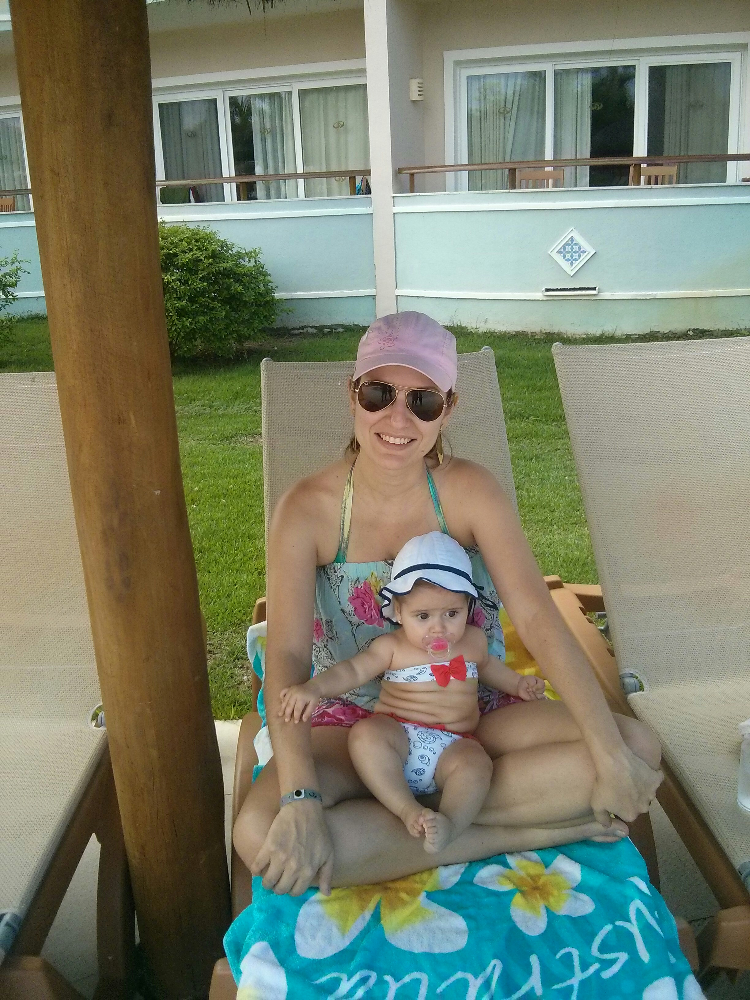

📷 2013-04-27_São_José_dos_Campos_bebê_berço_móbile_primeiros_passos.jpg – Similaridade: 0.60


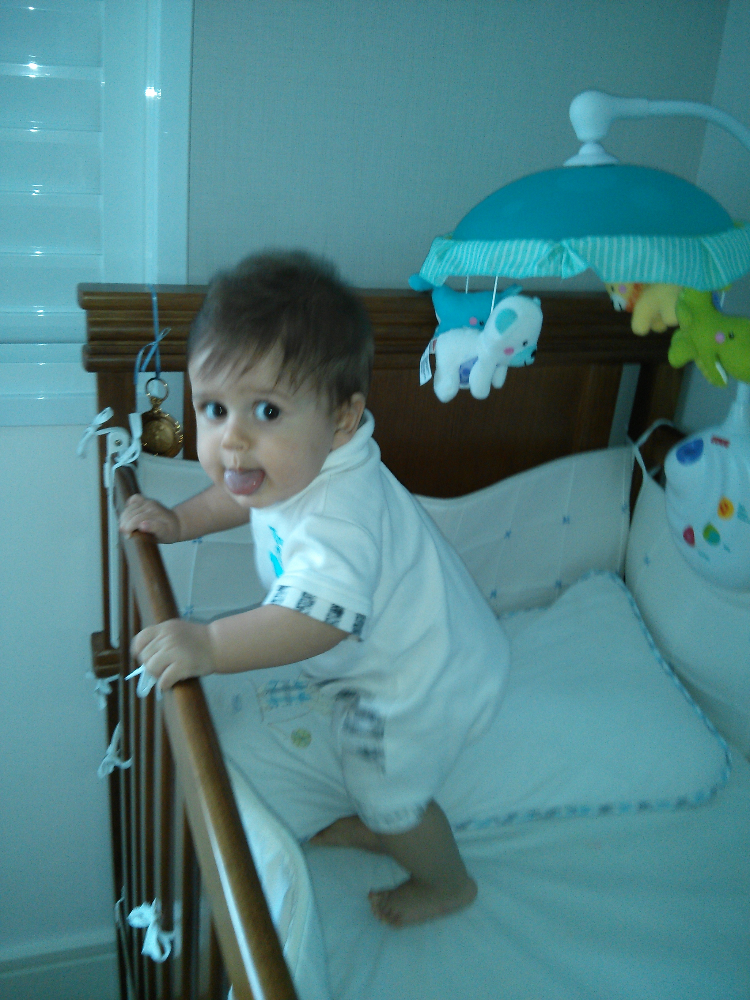

In [ ]:
buscar_fotos_por_texto("beach", top_k=2)

##  Ativando widgets interativos no notebook

Com a instalação do `ipywidgets`, podemos adicionar elementos gráficos como campos de entrada e botões.

Isso permite uma interface mais fluida e interativa para funcionalidades como a **busca textual por imagens**.


In [ ]:
!pip install ipywidgets --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 43.2 MB/s eta 0:00:00


##  Interface Interativa para Busca Semântica

Para tornar o sistema mais acessível e prático, adicionamos uma interface interativa com widgets:

- Um campo de texto para digitar a descrição da busca (ex: "casal sorrindo", "pôr do sol");
- Um slider para definir o número de imagens retornadas (Top K);
- Um botão para executar a busca.

Com isso, qualquer pessoa pode interagir com as fotos de forma intuitiva, explorando o acervo pessoal como se estivesse em um buscador multimodal.


In [ ]:
import ipywidgets as widgets
from IPython.display import display, Image, clear_output
from sklearn.metrics.pairwise import cosine_similarity

# Cria os elementos da interface
query_input = widgets.Text(
    value='casal na praia ao entardecer',
    placeholder='Digite algo como "família sorrindo", "praia de tarde", etc.',
    description='Busca:',
    layout=widgets.Layout(width='80%')
)

top_k_slider = widgets.IntSlider(
    value=3,
    min=1,
    max=10,
    step=1,
    description='Top K:',
    continuous_update=False
)

search_button = widgets.Button(
    description='Buscar fotos',
    button_style='success'
)

output = widgets.Output()

# Função de busca
def buscar_callback(_):
    query = query_input.value
    top_k = top_k_slider.value

    with output:
        clear_output()
        try:
            response = genai.embed_content(
                model="models/embedding-001",
                content=query,
                task_type="retrieval_query"
            )
            query_emb = np.array(response['embedding']).reshape(1, -1)
            image_embs = np.array(embeddings)

            sims = cosine_similarity(query_emb, image_embs)[0]
            indices = np.argsort(sims)[::-1][:top_k]

            print(f"\n Resultados para: “{query}” (Top {top_k})\n")
            for i in indices:
                photo = valid_photos[i]
                print(f" {photo['filename']} – Similaridade: {sims[i]:.2f}")
                display(Image(filename=photo['file_path']))
        except Exception as e:
            print("Erro ao buscar:", e)

search_button.on_click(buscar_callback)

# Exibir a interface
display(widgets.VBox([query_input, top_k_slider, search_button, output]))


### Considerações Finais

Nosso sistema foi capaz de:

- Ler fotos de um dump desorganizado do Google Photos;
- Extrair metadados úteis (data e local);
- Realizar geocodificação de coordenadas;
- Gerar nomes descritivos com IA multimodal (Gemini);
- Consolidar todas as informações automaticamente.

Isso pode ser aplicado em:

- Organização pessoal de arquivos;
- Ferramentas de backup inteligente;
- Sistemas de busca em arquivos multimídia.